<a href="https://colab.research.google.com/github/MLGlobalHealth/population-comparison/blob/main/Compare_Worldpop_vs_Facebook_vs_Census_population_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# The purpose of this notebook is to perform a comparative analysis of the High-Resolution Population Density Maps created by Meta and the population data for Lesotho compiled by the U.S Census Bureau. The goal of this analysis is to examine the accuracy of the two datasets and identify any discrepancies in estimating the population count at the district level and by age and gender.

# To conduct this analysis, we will be using two datasets:




1.   [High-Resolution Population Density Maps](https://data.humdata.org/m/organization/facebook?q=high+resolution+population+density&ext_page_size=100)
2.   [U.S. Census Bureau ](https://www.popgrid.org/uscb)

3. [Worldpop](https://wopr.worldpop.org/?KEN/)

# By examining and disaggregating the data from these two sources, we aim to gain insights into the accuracy of the population estimates for Lesotho and identify any potential areas for improvement in the methods used to estimate population density.




# Here's a summary of the steps we wiill take to compare population data from three sources (worldpop, census and Facebook) in Lesotho:

1. Obtain the administrative boundary polygons for Lesotho and the corresponding population data from the datasets.
2. Use a masking function to extract the population counts for each administrative boundary from the raster population data for each source.
3. Add the population counts to the administrative boundary data frames for each source.
4. Combine the three data frames into one and added a column to indicate the source of the data.
5. Compare the population estimates between the three sources for each administrative boundary using descriptive statistics and visualizations.

# The goal of these steps is to assess the level of agreement between the population estimates from the two sources, and identify any potential discrepancties or inconsistencies that may need further investigation.

# Get the link to the dataset and copy data to your drive and mount to your drive

Before we begin our analysis, we need to connect the notebook to your Google Drive. To do so, please run the following lines of code:

In [2]:
#Now to make sure you are running the notebook on your drive, you have to mount your drive:
# the below will ask for permission, you should agree: 
# Your output should be "Mounted at /content/drive"
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


After executing these commands, you will be prompted to provide authorization to access your Google Drive. Once you complete the authorization, you will be able to access the files in your Google Drive directly from your notebook. This will allow you to seamlessly load and manipulate the data for your analysis.

In order to begin our analysis, the first step is to load the dataset. Instead of downloading the data, we have created a shared drive where we have added the dataset. Therefore, before starting, please ensure that you check this [link]((https://drive.google.com/drive/folders/1MQvvb-jawOH1Uui6linT4J42YVqH9LsA?usp=sharing)) and make a copy of this folder named "all_data" to your drive in the same path as the notebook. This will allow you to access the dataset seamlessly and perform the necessary analysis without any hassle.

In [1]:
# 1. open https://drive.google.com/drive/folders/1MQvvb-jawOH1Uui6linT4J42YVqH9LsA?usp=sharing
# 2. click on "data" folder -> click "Add shortcut to Drive" -> click "ADD SHORTCUT"
# 3. Now you have obtained the data on your own google drive.

After mounting your Google Drive and copying the data, the next step is to navigate to the directory where you copied the "data" folder.

To do this, you can use the following commands:

In [3]:
# go to the path in your drive where you added the short cut for the "data" folder from step 1: 
hpath = "drive/MyDrive/all_data/"
!echo $hpath
%cd $hpath

drive/MyDrive/all_data/
/content/drive/MyDrive/population_data/population_data/all_data



The first command sets the variable hpath to the path where you copied the "data" folder. The second command prints the value of hpath to confirm that it has been set correctly. The third command changes the working directory to hpath so that you can access the files in the "data" folder directly from your notebook.

Let's verify that you are in the correct directory. Please type the following command in your terminal or command prompt:

ls

If you see two directories named "census" and "Meta" listed, then you are in the correct directory. If not, please navigate to the directory where you have stored the necessary files before proceeding with the analysis.

In [4]:
# Check if you are in the right directery, the output here should be census/, Meta/
!ls

 all_data_together_by_specific_ages.csv
 census
 census+facebook+world_female.csv
 census+facebook+world_male.csv
 census_les_ages_2020.csv
 census_les_female_all_states_ages_2020.csv
 census_les_male_all_states_ages_2020.csv
 census_les_states_ages_2020.csv
'Copy of census'
 facebook_les_ages_2020.csv
 female_data.png
 lesotho-adm1-uscb-jun20.zip
 les_world_2020.csv
 lso_cencus_total_2020.csv
 lso_fb_2020.csv
 male_data.png
 Meta
 Nigeria_cartogram.png
 worldpo_census_facebook_data_together.csv
 worldpop
 worldpop+censu+facebook.csv
 worldpop+censu+facebook_million.csv
 worldpop_census_facebook_data_together.csv
 worldpop_les_ages_2020.csv
 worldpop_les_female_all_states_ages_2020.csv
 worldpop_les_male_all_states_ages_2020.csv
 worldpop_les_states_pop.csv


# Install and import *package*

To use certain functionalities in Python, we may need to install specific packages. In this case, you need to install the packages rasterio, swifter, and geopandas.

To install these packages, you can use the following commands:

In [5]:
# install packages

!pip install rasterio
!pip install swifter
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.1/20.1 MB 73.7 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 830.9/830.9 KB 40.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 84.2 MB/s eta 0:00:00
  Created wheel for swifter: filename=swifter-1.3.4-py3-none-any.whl size=16321 sha256=ea90aa2602c041244a4be596bb64eccfec54a1101360b7dd1048167c629b86d9
  Stored in directory: /root/.cache/pip/wheels/2b/5e/f2/3931524f702ffd03309e96d35ee2fbf9c61c27377511ee8d4c
Successfully built swifter
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 43.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB

These commands use the pip package manager to install the required packages in your Python environment. Once these packages are installed, you will be able to use the corresponding functionalities in your analysis.

In Python, we can use the warnings module to handle warning messages. Sometimes, running certain functions or modules may generate warning messages that we do not want to see.

To ignore these warning messages, you can use the following code at the beginning of your notebook:

In [6]:
import warnings
warnings.filterwarnings('ignore')

import Python packages that we used in our analysis

In [7]:
#import packages
import pandas as pd
import pandas as pd
import matplotlib.pyplot as plt
import math
import seaborn as sns 
import imageio
import pandas as pd
import pathlib
import matplotlib.animation as animation
import matplotlib.pyplot as plt
import numpy as np
import rasterio
from rasterio import mask
from rasterio.plot import show,show_hist

import matplotlib.pyplot as plt
import plotly.express as px
import swifter

import geopandas as gpd
import numpy as np
import json

import shapely
from shapely.geometry import Polygon, Point
from shapely.ops import cascaded_union
import shapely.speedups
# !pip install plotnine
from plotnine.data import economics
from plotnine import ggplot, aes, geom_line, geom_col,theme_minimal,scale_x_continuous

shapely.speedups.enable()

# Load the dataset




## Loading and Exploring Population Data in from census

Let us first load the Lesotho administrative boundaries data from the census dataset. The data is in the form of a shapefile and contains information about the different administrative units or districts in Lesotho.

To load the data, we are making use of the geopandas package which allows us to read and manipulate geospatial data. We are using the read_file() function from geopandas to read the shapefile into a geopandas dataframe called Lesotho_administrative_boundaries.

Once the data has been loaded, we can explore it to get a better understanding of the data. This can include checking the number of rows and columns, examining the column names and data types, and visualizing the data on a map. The Lesotho_administrative_boundaries dataframe can be printed to the screen to inspect the loaded data.

In [8]:
Lesotho_administrative_boundaries = gpd.read_file('census/lesotho-adm1-uscb-jun20/Lesotho_adm1_uscb_2020.shp')
Lesotho_administrative_boundaries

,Shape_Leng,Shape_Area,AREA_NAME,GEO_CONCAT,GEO_MATCH,CNTRY_NAME,ADM1_NAME,ADM_LEVEL,GENC_CODE,FIPS_CODE,NSO_CODE,geometry
0,3.364043,0.183431,BEREA,LESOTHO_BEREA,LSO_03,LESOTHO,BEREA,1,LS-D,LT10,3,"POLYGON ((27.98593 -28.94685, 27.98599 -28.946..."
1,2.613805,0.165235,BUTHA-BUTHE,LESOTHO_BUTHA-BUTHE,LSO_01,LESOTHO,BUTHA-BUTHE,1,LS-B,LT11,1,"POLYGON ((28.65142 -28.57057, 28.65145 -28.570..."
2,5.798481,0.261754,LERIBE,LESOTHO_LERIBE,LSO_02,LESOTHO,LERIBE,1,LS-C,LT12,2,"POLYGON ((28.18352 -28.69359, 28.18378 -28.693..."
3,3.640401,0.200510,MAFETENG,LESOTHO_MAFETENG,LSO_05,LESOTHO,MAFETENG,1,LS-E,LT13,5,"POLYGON ((27.27873 -29.52665, 27.27990 -29.527..."
4,5.316844,0.371898,MASERU,LESOTHO_MASERU,LSO_04,LESOTHO,MASERU,1,LS-A,LT14,4,"POLYGON ((27.50580 -29.28208, 27.50667 -29.282..."
5,5.694581,0.345687,MOHALE'S HOEK,LESOTHO_MOHALE'S HOEK,LSO_06,LESOTHO,MOHALE'S HOEK,1,LS-F,LT15,6,"POLYGON ((28.55848 -29.78321, 28.55900 -29.783..."
6,4.497314,0.386815,MOKHOTLONG,LESOTHO_MOKHOTLONG,LSO_09,LESOTHO,MOKHOTLONG,1,LS-J,LT16,9,"POLYGON ((28.85799 -28.75541, 28.85858 -28.755..."
7,3.617690,0.198658,QACHA'S NEK,LESOTHO_QACHA'S NEK,LSO_08,LESOTHO,QACHA'S NEK,1,LS-H,LT17,8,"POLYGON ((29.03196 -29.70939, 29.03351 -29.710..."
8,3.678044,0.279084,QUTHING,LESOTHO_QUTHING,LSO_07,LESOTHO,QUTHING,1,LS-G,LT18,7,"POLYGON ((28.25464 -30.02283, 28.25674 -30.022..."
9,6.244152,0.452519,THABA-TSEKA,LESOTHO_THABA-TSEKA,LSO_10,LESOTHO,THABA-TSEKA,1,LS-K,LT19,10,"POLYGON ((28.28211 -29.11906, 28.28301 -29.119..."


In this step, we are using the nunique() function to check the number of unique values in the 'ADM1_NAME' column of the Lesotho_administrative_boundaries dataframe. The 'ADM1_NAME' column contains the names of the administrative units or districts in Lesotho.

The expected output of this command is the number of unique district names in Lesotho. Since we are dealing with administrative boundaries at the district level, we expect the output to be 10, which represents the number of districts in Lesotho.

This check is important to ensure that the data has been loaded correctly and that we have the correct number of administrative boundaries or districts for Lesotho. If the output is not 10, we may need to investigate further to identify any potential issues with the data.

In [9]:
#Check the number of Lesotho administrative bounderies levels (should be 10 districts):
Lesotho_administrative_boundaries['ADM1_NAME'].nunique()

10

Let us creat a plot of the Lesotho administrative boundaries or districts to visualize the geographic extent of the data.

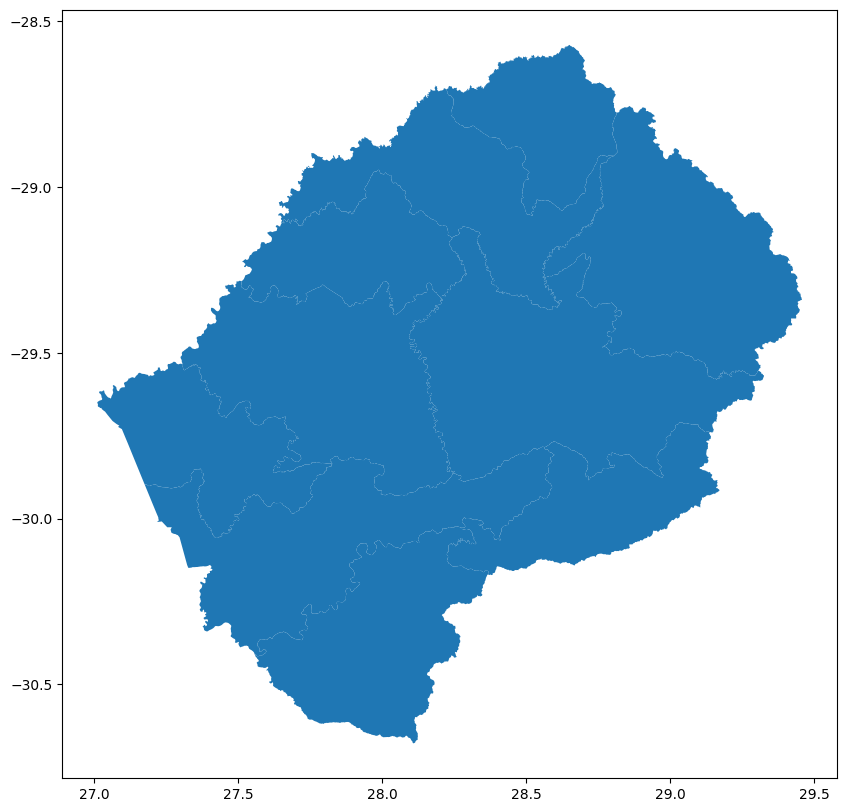

In [10]:
# Plot the Lesotho administrative boundaries (districts):
fig, ax = plt.subplots(figsize=(10, 10)) # create a matplotlib figure object with size 10x10
Lesotho_administrative_boundaries.plot(ax=ax) # plot the districts on the specified axes object
plt.show() # display the plot


Before we can compare and contrast the population data from the U.S Census Bureau with the High-Resolution Population Density Maps created by Meta, we need to load the census data for Lesotho.

We have loaded the Lesotho_administrative_boundaries to provides the geographic boundary data for the different districts in Lesotho, while the census data provides the actual population counts for each of these districts.

By loading and merging these datasets, we can perform spatial analysis at the district level to determine the population density for each district in Lesotho. This will help us compare and contrast the population data from the U.S Census Bureau with the High-Resolution Population Density Maps created by Meta.

In [11]:
# Load the census data 2020
import openpyxl

workbook = openpyxl.load_workbook(filename='census/lesotho.xlsx') # load the Excel workbook containing the census data

# Select the worksheet
worksheet = workbook['2000 - 2025'] # select the worksheet named "2000 - 2025"

# Read the data into a dataframe starting from row 4
data_rows = worksheet.iter_rows(min_row=5, values_only=True) # iterate over the rows of the worksheet starting from row 5 and extract the values
data = pd.DataFrame(data_rows, columns=[cell.value for cell in worksheet[4]]) # create a pandas dataframe with the extracted values and use the values in the 4th row as column names

the code above loads the census data for Lesotho from an Excel file named lesotho.xlsx. The openpyxl library is used to read the Excel file. The code selects the worksheet named 2000 - 2025 from the workbook. The iter_rows() method is used to iterate over the rows of the worksheet starting from row 5, which contains the actual data. The values_only parameter is set to True to extract only the cell values.

Finally, the extracted data is converted to a pandas dataframe using the pd.DataFrame() method. The column names are set to the values in the 4th row of the worksheet.

Next, we will preprocess the census data for Lesotho to extract the total population count for males and females in each district. The data contains population counts for each age group. The result of this preprocessing will be a pandas DataFrame containing the total population for males and females in each district, broken down by age groups. We will extract the population data for the age groups specified in the age list, which includes the following age groups: 0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80.

In [12]:
# define the age range we are going to use

age = ['0', '5' ,'10','15','20', '25', '30','35','40','45','50','55','60','65','70','75','80']

In [13]:
# Define the columns containing the total population for Lesotho and population for male and female
l = ['BTOTL_2020','FTOTL_2020','MTOTL_2020'].copy()       

# Define names for the columns to use in the final dataframe
name =['general','women','man']

# Extract the columns containing total population data for Lesotho and population for male and female 
df_lesotho = data[l].copy()

# Rename the columns of the extracted dataframe
df_lesotho.columns = name                                 

# Get the district level data from the original dataframe
dm_level_d= data['AREA_NAME']

# Combine the district level data with the extracted population data
df_lesotho = pd.concat([dm_level_d, df_lesotho], axis = 1)

# Export the final dataframe to a csv file
df_lesotho.to_csv('lso_cencus_total_2020.csv',index=False)

# Show the final dataframe
df_lesotho

,AREA_NAME,general,women,man
0,LESOTHO,1969334,994675,974659
1,.BUTHA-BUTHE,115861,58450,57411
2,.LERIBE,340670,172472,168198
3,.BEREA,255142,128587,126555
4,.MASERU,533235,275787,257448
5,.MAFETENG,164001,80531,83470
6,.MOHALE'S HOEK,153145,76436,76709
7,.QUTHING,106552,53173,53379
8,.QACHA'S NEK,72985,36703,36282
9,.MOKHOTLONG,96691,47995,48696


Now let us extract the total population data for all age groups for each district of Lesotho from the data dataframe. We define the column range for the population data for each age group and create a new dataframe with this data. We also rename the columns to the age group values defined in the age list

In [14]:
# Extracting the total population for each age group for each district in Lesotho
# Select columns with the age group data (columns 1095 to 1111)
df_lesotho = data[data.columns.values[1095:1112]].copy()

# Rename the columns to match the age groups
df_lesotho.columns = age

# Extract the district names
dm_level_d= data['AREA_NAME']

# Concatenate the district names with the age group data
df_lesotho = pd.concat([dm_level_d, df_lesotho], axis=1)

# Save the data to a csv file
df_lesotho.to_csv('census_les_states_ages_2020.csv', index=False)

# Display the resulting dataframe
df_lesotho

,AREA_NAME,0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80
0,LESOTHO,212838,204333,199141,196554,182772,179544,178757,164982,116436,69950,55555,52236,45931,36866,29261,20694,23484
1,.BUTHA-BUTHE,12649,12551,11974,11141,10238,10327,10418,9474,6689,4020,3381,3237,2848,2316,1899,1232,1467
2,.LERIBE,36205,35268,33673,33813,31413,31404,31504,28922,20279,12535,9752,9304,8007,6284,4921,3401,3985
3,.BEREA,27186,25866,24999,25163,23196,22763,23317,21724,15460,9808,7766,7441,6364,4763,3791,2712,2823
4,.MASERU,55812,49868,47902,50052,54512,54204,53746,50833,34532,19774,14498,12762,10838,8522,6315,4347,4718
5,.MAFETENG,17136,16592,17001,17034,14306,14256,14037,12898,9417,5714,4952,4987,4507,3962,2808,2082,2312
6,.MOHALE'S HOEK,16389,16335,16367,15607,13655,13152,12939,11406,8455,5291,4555,4529,4131,3356,2746,1945,2287
7,.QUTHING,11716,11478,11611,11253,9937,9405,9004,7727,5527,3469,3000,2874,2704,2196,1843,1368,1440
8,.QACHA'S NEK,8267,8154,8219,7897,6381,6193,6255,5499,3799,2329,1995,1935,1650,1392,1146,799,1075
9,.MOKHOTLONG,11523,11876,11925,10577,8316,7628,7564,7094,5198,2888,2373,2142,2044,1701,1501,1012,1329


Now, let's extract the total population for male and female for different age groups


In [15]:
#Extract data for male and female
df_lesotho_male = data[data.columns.values[1113:1130]].copy()
df_lesotho_female = data[data.columns.values[1131:1148]].copy()
df_lesotho_male.columns = age
df_lesotho_female.columns = age

#Add district name column
dm_level_d= data['AREA_NAME']
df_lesotho_male = pd.concat([dm_level_d, df_lesotho_male], axis = 1)
df_lesotho_female = pd.concat([dm_level_d, df_lesotho_female], axis = 1)

#Save the data to CSV files
df_lesotho_male.to_csv('census_les_states_male_ages_2020.csv',index=False)
df_lesotho_female.to_csv('census_les_states_female_ages_2020.csv',index=False)

#Display the male data as an example
df_lesotho_male.head()

,AREA_NAME,0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80
0,LESOTHO,107656,102975,99360,95928,85946,82558,83248,78878,59816,38296,30527,28041,24400,19862,15707,10809,10652
1,.BUTHA-BUTHE,6333,6181,5908,5290,4781,4840,4969,4648,3503,2187,1865,1783,1508,1265,987,670,693
2,.LERIBE,18294,17860,16616,16536,14654,14331,14608,13727,10288,6859,5408,4982,4264,3395,2645,1856,1875
3,.BEREA,13784,12977,12546,12252,11130,10493,10756,10346,7885,5281,4278,4059,3434,2557,2053,1446,1278
4,.MASERU,28254,25090,23870,23623,24266,23637,24016,23483,17647,10892,8031,6761,5735,4444,3333,2186,2180


In [16]:
# # saviing the populatin count with geometry for future analysis in R
# df_lesotho = pd.read_csv('lso_cencus_total_2020.csv')

# adm_level_c = Lesotho_administrative_boundaries[['ADM1_NAME','geometry']]
# adm_level_c['population'] = df_lesotho['general']
# adm_level_c.crs= "2311"
# adm_level_c.to_file('../cartogram_census_output.shp', driver='ESRI Shapefile')
        

In conclusion, we have loaded and explored the population data for Lesotho from the US Census Bureau. We first loaded the administrative boundaries of Lesotho and plotted them to get a visual representation of the districts. We then loaded the census data for 2020 and extracted the total population for both male and female by district and age. We also extracted the total population for all ages and districts. All the resulting dataframes were saved to csv files for future use. These preprocessed datasets will be useful for further analysis and visualization.

## Loading and Exploring Population Data in  Raster Format from worldpop

Let us load and read WorldPop data by first open a raster file that containing population data for Lesotho, and then read the first band of the raster. 

In [97]:
%%time
# Open the worldpop raster file using the rasterio library
Lesotho_worldpop_raster = rasterio.open('worldpop/lso_ppp_2020_UNadj_constrained.tif')

# Print the number of bands in the raster file
print('No. of bands:',(Lesotho_worldpop_raster.count))

# Read the first band of the raster and assign it to a variable
Lesotho_worldpop_raster_tot = Lesotho_worldpop_raster.read(1)

# Return the first band of the raster
Lesotho_worldpop_raster_tot


No. of bands: 1
CPU times: user 63.2 ms, sys: 6.83 ms, total: 70 ms
Wall time: 76.5 ms


array([[-99999., -99999., -99999., ..., -99999., -99999., -99999.],
       [-99999., -99999., -99999., ..., -99999., -99999., -99999.],
       [-99999., -99999., -99999., ..., -99999., -99999., -99999.],
       ...,
       [-99999., -99999., -99999., ..., -99999., -99999., -99999.],
       [-99999., -99999., -99999., ..., -99999., -99999., -99999.],
       [-99999., -99999., -99999., ..., -99999., -99999., -99999.]],
      dtype=float32)

Define function to get population count within a given polygon

In [98]:
#  This function takes a list of geometries (polygons) and combines them into a single boundary It does so by creating a GeoSeries object using the input geometries,
# then applying the cascaded_union function The cascaded_union function returns a single polygon object that represents the union of all the input polygons
def concat_polygon(geometry_list):
    polygons = geometry_list
    boundary = gpd.GeoSeries(cascaded_union(polygons))
    return(boundary)

def get_population_count(vector_polygon, raster_layer):
    # Use rasterio.mask to mask the raster layer with the vector polygon and crop it
    gtraster, bound = rasterio.mask.mask(raster_layer, [vector_polygon], crop=True)
    # Extract population values from the masked raster layer and sum them
    pop_estimate = gtraster[0][gtraster[0]>0].sum()
    # Return the rounded population estimate
    return (pop_estimate.round(2))

Let us calculates the total population of Lesotho using the WorldPop raster data.

In [99]:
#Calculating total population of Lesotho 

worldpop_raster_nonzero = Lesotho_worldpop_raster_tot[Lesotho_worldpop_raster_tot>0]
population_worldpop = worldpop_raster_nonzero[worldpop_raster_nonzero > 0].sum()
print(round(population_worldpop/1000000,2),'million')

Lesotho_administrative_boundaries['population_count_wp'] = Lesotho_administrative_boundaries['geometry'].apply(get_population_count,raster_layer=Lesotho_worldpop_raster)
Lesotho_administrative_boundaries['population_count_wp_million'] = round(Lesotho_administrative_boundaries['population_count_wp']/1000000,2)


# save each age to csv file 
adm_level_c = Lesotho_administrative_boundaries[['ADM1_NAME','population_count_wp']]#,'population_count_wp_million',]]#.round(1).reset_index()

adm_level_c.loc[10] = ['LESOTHO',adm_level_c['population_count_wp'].sum()]
adm_level_c = pd.concat([adm_level_c[-1:],adm_level_c[:10]])
 
adm_level_c.to_csv('worldpop_les_states_pop.csv',index=False)
adm_level_c


2.14 million


,ADM1_NAME,population_count_wp
10,LESOTHO,2.142050e+06
0,BEREA,3.201528e+05
1,BUTHA-BUTHE,1.252255e+05
2,LERIBE,3.144881e+05
3,MAFETENG,1.858036e+05
4,MASERU,5.268488e+05
5,MOHALE'S HOEK,1.828048e+05
6,MOKHOTLONG,1.298806e+05
7,QACHA'S NEK,7.959317e+04
8,QUTHING,1.333435e+05


In [100]:
Lesotho_administrative_boundaries

,Shape_Leng,Shape_Area,AREA_NAME,GEO_CONCAT,GEO_MATCH,CNTRY_NAME,ADM1_NAME,ADM_LEVEL,GENC_CODE,FIPS_CODE,...,population_count_fb,population_count_fb_million,population_count_wp,population_count_wp_million,population_count_children_under_five,population_count_children_under_five_million,population_count_youth_15_24,population_count_youth_15_24_million,population_count_elderly_60_plus,population_count_elderly_60_plus_million
0,3.364043,0.183431,BEREA,LESOTHO_BEREA,LSO_03,LESOTHO,BEREA,1,LS-D,LT10,...,17981.77,0.02,320152.750000,0.32,1833.24,0.00,4331.45,0.00,1259.41,0.00
1,2.613805,0.165235,BUTHA-BUTHE,LESOTHO_BUTHA-BUTHE,LSO_01,LESOTHO,BUTHA-BUTHE,1,LS-B,LT11,...,145900.40,0.15,125225.476562,0.13,15788.51,0.02,34634.40,0.03,11211.13,0.01
2,5.798481,0.261754,LERIBE,LESOTHO_LERIBE,LSO_02,LESOTHO,LERIBE,1,LS-C,LT12,...,367135.91,0.37,314488.093750,0.31,38722.45,0.04,86955.71,0.09,28280.16,0.03
3,3.640401,0.200510,MAFETENG,LESOTHO_MAFETENG,LSO_05,LESOTHO,MAFETENG,1,LS-E,LT13,...,216973.70,0.22,185803.593750,0.19,22381.40,0.02,53320.21,0.05,18523.63,0.02
4,5.316844,0.371898,MASERU,LESOTHO_MASERU,LSO_04,LESOTHO,MASERU,1,LS-A,LT14,...,614916.09,0.61,526848.750000,0.53,61462.73,0.06,149906.93,0.15,40058.49,0.04
5,5.694581,0.345687,MOHALE'S HOEK,LESOTHO_MOHALE'S HOEK,LSO_06,LESOTHO,MOHALE'S HOEK,1,LS-F,LT15,...,213074.11,0.21,182804.796875,0.18,23763.89,0.02,50275.03,0.05,18633.22,0.02
6,4.497314,0.386815,MOKHOTLONG,LESOTHO_MOKHOTLONG,LSO_09,LESOTHO,MOKHOTLONG,1,LS-J,LT16,...,151412.21,0.15,129880.640625,0.13,20139.79,0.02,33198.10,0.03,11840.14,0.01
7,3.617690,0.198658,QACHA'S NEK,LESOTHO_QACHA'S NEK,LSO_08,LESOTHO,QACHA'S NEK,1,LS-H,LT17,...,92735.73,0.09,79593.171875,0.08,10582.78,0.01,21229.72,0.02,7640.28,0.01
8,3.678044,0.279084,QUTHING,LESOTHO_QUTHING,LSO_07,LESOTHO,QUTHING,1,LS-G,LT18,...,157102.73,0.16,133343.515625,0.13,16979.38,0.02,36267.21,0.04,13818.37,0.01
9,6.244152,0.452519,THABA-TSEKA,LESOTHO_THABA-TSEKA,LSO_10,LESOTHO,THABA-TSEKA,1,LS-K,LT19,...,167867.78,0.17,143909.390625,0.14,21730.92,0.02,35744.90,0.04,14124.65,0.01


The following code aims to create a choropleth map of Lesotho, using population data from Facebook. The map shows the population counts per administrative boundaries, with each boundary colored according to its population count.


In [101]:
#select the necessary columns from the Lesotho administrative boundaries dataset, and round the population count to 1 decimal point.
adm_level = Lesotho_administrative_boundaries[['ADM1_NAME','population_count_wp_million','geometry']].round(1).reset_index()
#convert the geometry column to GeoJSON format
adm_level['geometry'] = adm_level['geometry'].apply(lambda x:gpd.GeoSeries(x).to_json())

#Instantiate list of features
dept_geo = []

#Get data from dataset (using json.loads to transform string into dict for geoshape column)
cd_depts = adm_level['ADM1_NAME'].tolist()
shapes = adm_level['geometry'].values

#Iterate over lines
for x in range(0,len(adm_level['geometry'].values),1):
  shape = json.loads(adm_level['geometry'].values[x])['features'][0]['geometry']
  # Mapping information from data to GeoJSON file
  dept_geo.append({
  'type': 'Feature',
  'geometry': shape,
  'id':cd_depts[x]
  })


# Encapsulate dept_geo in a real GeoJSON formatted file
dept_geo_ok = {'type': 'FeatureCollection', 'features': dept_geo}
# print(dept_geo_ok)


#Next, we calculate the centroid of each administrative boundary, and add the x and y coordinates as new columns.
adm_level = Lesotho_administrative_boundaries[['ADM1_NAME','population_count_wp_million','geometry']].round(1).reset_index()
# print(adm_level)
adm_level['centroid'] = adm_level['geometry'].apply(lambda x:gpd.GeoSeries(x).centroid)
adm_level['centroid_x'] = adm_level['centroid'].apply(lambda p: p.x)
adm_level['centroid_y'] = adm_level['centroid'].apply(lambda p: p.y)
adm_level['all'] = Lesotho_administrative_boundaries[['ADM1_NAME','population_count_wp_million']].round(1).apply(tuple, axis=1)


fig = px.choropleth(adm_level, geojson=dept_geo_ok, locations='ADM1_NAME', color='population_count_wp_million',
                           color_continuous_scale="viridis",
                           range_color=(adm_level['population_count_wp_million'].min(), adm_level['population_count_wp_million'].max()),
                           labels={'population_count_wp_million':'Population WorldPop (Million)'}
                          )


#We add a text label at the centroid of each administrative boundary, showing the population count.
fig.add_scattergeo(
    geojson=dept_geo_ok,
    lat=[x for x in adm_level['centroid_x']],
    lon=[x for x in adm_level['centroid_y']],
    locations = adm_level['ADM1_NAME'],
    text = adm_level['all'],
    textfont=dict(
    family="sans serif",
    size=8,
    color="red"
    ),
    mode = 'text')

#update the hover template to show only the name of the administrative boundary.
fig.update_traces(hovertemplate =adm_level['ADM1_NAME'])

#set the bounds of the map to fit the locations, and adjust the layout to remove margins and increase the size.
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"t": 30, "b": 0})
fig.show()




In [102]:
# saviing the populatin count with geometry for future analysis in R
adm_level_c = Lesotho_administrative_boundaries[['ADM1_NAME','geometry']]
adm_level_c['population'] = Lesotho_administrative_boundaries['population_count_wp']
adm_level_c.crs= "2311"
adm_level_c.to_file('../cartogram_worldpop_output.shp', driver='ESRI Shapefile')
        

The next step is to preprocess the WorldPop data and extract population data for all ages from 0-80 aggregated by 5, sex, and for all Lesotho states. This involves calculating the total population of Lesotho using the WorldPop data and adding a new column to the administrative boundaries data frame containing the population count for each state according to the WorldPop data. The resulting data will be saved as a CSV file for further analysis and visualization.

In [103]:
dir = ''

In [104]:

# save the data for male, female, age
from csv import writer

for j in ['f','m']:
    adm_level_d= Lesotho_administrative_boundaries['ADM1_NAME']
    adm_level_d.loc[len(adm_level_d.index)] = 'Total'
    l = []
    l.append('LESOTHO')
    adm_level_d.to_csv(dir+'worldpop/worldpop_les_'+j+'_age_states_2020.csv',index=False)
    k = [p for p in range(0,85,5)]
    k.append(1)
    print(k)
    for i in k:
        # Open worldpop raster file
        with rasterio.open(dir+'worldpop/lso_'+j+'_'+str(i)+'_2020_constrained.tif') as Lesotho_worldpop_raster:
            # Read raster data
            Lesotho_worldpop_raster_tot = Lesotho_worldpop_raster.read(1)
            Lesotho_worldpop_raster_tot[Lesotho_worldpop_raster_tot < 0] = None

            # Calculate total population
            worldpop_raster_nonzero = Lesotho_worldpop_raster_tot[Lesotho_worldpop_raster_tot > 0]
            population_worldpop = worldpop_raster_nonzero[worldpop_raster_nonzero > 0].sum()
            l.append(population_worldpop)

            # Calculate population count for each state
            Lesotho_administrative_boundaries['population_count_wp'] = \
                Lesotho_administrative_boundaries['geometry'].apply(get_population_count,
                                                                     raster_layer=Lesotho_worldpop_raster)

      
        
            # save each age to csv file 
            adm_level_c = Lesotho_administrative_boundaries[['ADM1_NAME','population_count_wp','population_count_wp_million',]]#.round(1).reset_index()
            adm_level_c.to_csv('worldpop/worldpop_les_'+j+'_'+str(i)+'_states_pop.csv',index=False)
        
        
        
            #save all ages to one csv file 
            adm_level_d= Lesotho_administrative_boundaries[['population_count_wp']]
            adm_level_d.columns= [str(i)]
            # adm_level_d.loc[len(adm_level_d.index)] = ['Total',population_worldpop]
            csv_input = pd.read_csv(dir+'worldpop/worldpop_les_'+j+'_age_states_2020.csv')
            csv_input[str(i)] = adm_level_d[str(i)]
            # csv_input.loc[10] = [p for p in l]
            csv_input.to_csv(dir+'worldpop/worldpop_les_'+j+'_age_states_2020.csv', index=False)

    with open(dir+'worldpop/les_'+j+'_age_states_2020.csv','a') as f_object:
        writer_object = writer(f_object)
 
        # Pass the list as an argument into
        # the writerow()
        writer_object.writerow(l)

        # Close the file object
        f_object.close()
    csv_input.loc[len(adm_level_c.index)] = [p for p in l]
    # print(adm_level_d)
    csv_input.to_csv(dir+'worldpop/worldpop_les_'+j+'_age_states_2020.csv',index=False)
    if j == 'f':
        j='female'
    else:
        j='male'
    csv_input.to_csv(dir+'worldpop/worldpop_les_'+j+'_all_states_ages_2020.csv',index=False)
    csv_input.to_csv(dir+'worldpop_les_'+j+'_all_states_ages_2020.csv',index=False)

    # print(csv_input)


    

[0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 1]
[0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 1]


Extract worldpop female and male data

In [107]:
# Save data for male and female
for j in ['female', 'male']:
    dir = ''
    df = pd.read_csv(dir + f'worldpop_les_{j}_all_states_ages_2020.csv')
    
    # Combine age group 0 and 1
    df['0'] += df['1']
    
    # Reorder and select relevant columns
    df = df[['ADM1_NAME','0', '5', '10', '15', '20', '25', '30', '35', '40', '45', '50', '55', '60', '65', '70', '75', '80']]
    
    # Move total row to the end and select first 10 rows
    df = swap_rows(df, 0, 10)
    
    # Save to CSV
    df.to_csv(dir + f'worldpop_les_{j}_all_states_ages_2020.csv', index=False)


In [108]:
df

,ADM1_NAME,0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80
0,LESOTHO,118884.595625,112633.796875,100521.375,94821.210938,92203.632812,83520.96875,75345.609375,64218.183594,46632.648438,32295.271484,24595.419922,21332.5625,20746.820312,18383.378906,13028.072266,6677.697266,5664.967285
1,BUTHA-BUTHE,6972.500000,6516.380000,6105.520,5690.240000,5502.630000,5096.13000,4449.250000,3726.090000,2709.600000,1915.870000,1567.700000,1286.7900,1280.440000,1107.500000,757.190000,412.440000,305.520000
2,LERIBE,17007.430000,16623.160000,14984.600,14127.330000,13485.540000,11962.18000,10604.590000,9794.900000,6904.540000,5106.600000,3637.190000,3180.9800,3091.170000,2701.650000,1890.500000,1098.510000,879.260000
3,MAFETENG,9993.690000,9579.710000,8925.390,9297.450000,8583.360000,6999.41000,6164.650000,5142.000000,3957.210000,2998.330000,2265.710000,2249.0600,2081.730000,1754.220000,1295.070000,667.210000,587.650000
4,MASERU,26879.200000,24335.550000,21953.570,21486.580000,23338.100000,22935.62000,20921.530000,17838.610000,12096.170000,7593.650000,5781.990000,4752.6000,4500.460000,3895.630000,2578.580000,1330.980000,1181.140000
5,MOHALE'S HOEK,10282.640000,9755.300000,8896.690,8556.160000,8089.410000,6805.65000,5802.370000,5125.210000,3936.180000,2796.460000,2278.330000,1999.0900,1975.210000,1696.230000,1287.820000,606.720000,527.310000
6,MOKHOTLONG,8807.790000,8232.440000,6541.410,5807.630000,5027.400000,4764.51000,4414.260000,3328.140000,2411.730000,1648.930000,1308.780000,1213.4400,1144.550000,1038.990000,931.020000,415.250000,359.730000
7,QACHA'S NEK,4610.580000,4648.430000,3882.240,3500.150000,3153.450000,2937.21000,2547.410000,2032.900000,1659.040000,1106.040000,871.240000,771.4000,745.110000,664.640000,511.140000,262.600000,200.140000
8,QUTHING,7505.800000,7377.710000,6640.570,6043.650000,5621.760000,4731.61000,4243.380000,3731.480000,2713.650000,2036.620000,1709.290000,1473.4900,1462.110000,1418.230000,928.500000,389.160000,315.090000
9,THABA-TSEKA,9615.620000,9208.270000,7324.950,6163.700000,5440.940000,5164.48000,4989.380000,3722.790000,2818.700000,1787.020000,1457.610000,1300.1100,1373.030000,1269.860000,1079.990000,560.250000,513.950000


In [86]:
# # Check the total population for worldpop 
# worldpop_tot = pd.read_csv(dir+'worldpop_les_states_pop.csv')

# print(worldpop_tot)
# wolrdpo_m = pd.read_csv(dir+'worldpop_les_male_all_states_ages_2020.csv')
# wolrdpo_f = pd.read_csv(dir+'worldpop_les_female_all_states_ages_2020.csv')

# worldpop_tot['women'] = wolrdpo_m.sum(axis=1)
# worldpop_tot['man'] = wolrdpo_f.sum(axis=1)

# worldpop_tot.columns.values[1] ='general'

# worldpop_tot.to_csv(dir+'les_world_2020.csv',index=False)

## Loading and Exploring Population Data in  Raster Format from Facebook

Facebook provides population data in raster format for many countries around the world, including Lesotho. This data is derived from satellite imagery and can be used to estimate population distribution at a higher resolution than the census data. In this section, we will explore how to load and work with this raster population data for Lesotho.

We will use the rasterio package in Python to read and process the raster data. We will also use the matplotlib and numpy packages to visualize and manipulate the data.


In [87]:
# Lesotho_administrative_boundaries = gpd.read_file('data/census/lesotho-adm1-uscb-jun20/Lesotho_adm1_uscb_2020.shp')
# Lesotho_administrative_boundaries


Lest us reads the metadata associated with the Facebook population data in Lesotho which is stored in a CSV file,

In [90]:
#Reading the meta data in csv format file

facebook_data_latest = pd.read_csv('Meta/lso_general_2020_csv/lso_general_2020.csv')
print(facebook_data_latest.head())

   longitude   latitude  lso_general_2020
0  27.072083 -27.999861          0.247126
1  27.072361 -27.999861          0.247126
2  27.072639 -27.999861          0.247126
3  27.072917 -27.999861          0.247126
4  27.073194 -27.999861          0.247126



The data consists of three columns: longitude, latitude, and lso_general_2020. Each row represents a pixel in the raster image, with longitude and latitude providing the location coordinates and lso_general_2020 providing the estimated population density value for that pixel.

In order to use the geospatial tools and techniques demonstrated with Facebook data, we need to convert this dataframe into a geodataframe which includes a geometry field using the Shapely library. This is a common preprocessing step when working with geospatial data. Once the points are created, they are used to create a GeoDataFrame from the original data frame. This allows us to work with the data using the geospatial functionality of the GeoPandas library, such as overlaying the population data with administrative boundaries.

In [89]:
# Define a function to convert latitude and longitude to a Shapely Point object
def convert_Point(facebook_data_latest):
    return Point(facebook_data_latest['longitude'],facebook_data_latest['latitude'])

# Apply the conversion function to the latitude and longitude columns and create a new 'geometry' column
facebook_data_latest['geometry'] = facebook_data_latest[['latitude','longitude']].apply(convert_Point,axis=1)

# Convert the dataframe to a GeoDataFrame
facebook_data_latest = gpd.GeoDataFrame(facebook_data_latest)


In [91]:
facebook_data_latest.head()

,longitude,latitude,lso_general_2020
0,27.072083,-27.999861,0.247126
1,27.072361,-27.999861,0.247126
2,27.072639,-27.999861,0.247126
3,27.072917,-27.999861,0.247126
4,27.073194,-27.999861,0.247126


In order to obtain population data for specific administrative boundaries in Lesotho, we use a masking function with a vector layer containing polygons that represent those boundaries. This function extracts the population counts per administrative boundary by summing up the population counts for all points within the boundaries. The resulting population count is then added as a new column to the administrative boundaries data frame.

In [92]:
# Define function to get population count within a given polygon
def get_population_count(vector_polygon, raster_layer):
    # Use rasterio.mask to mask the raster layer with the vector polygon and crop it
    gtraster, bound = rasterio.mask.mask(raster_layer, [vector_polygon], crop=True)
    # Extract population values from the masked raster layer and sum them
    pop_estimate = gtraster[0][gtraster[0]>0].sum()
    # Return the rounded population estimate
    return (pop_estimate.round(2))
Lesotho_meta_raster = rasterio.open('Meta/lso_general_2020_geotiff/lso_general_2020.tif')
#Apply the population counting function to each administrative boundary polygon, and store the result in a new column
Lesotho_administrative_boundaries['population_count_fb'] = Lesotho_administrative_boundaries['geometry'].apply(get_population_count,raster_layer=Lesotho_meta_raster)
#Calculate the population count per million and store the result in a new column
Lesotho_administrative_boundaries['population_count_fb_million'] = round(Lesotho_administrative_boundaries['population_count_fb']/1000000,2)

Now let us check the total population count of Lesotho using the Facebook population data. It is summing up the population count for all administrative boundaries in Lesotho and converting the result to million units. The expected answer is 2.15 million. The code prints the result.

In [93]:
#check the number of the population in Lesotho, the answer should be 2.15m
print(round(Lesotho_administrative_boundaries['population_count_fb'].sum()/1000000,2),',milion')

2.15 ,milion


The following code aims to create a choropleth map of Lesotho, using population data from Facebook. The map shows the population counts per administrative boundaries, with each boundary colored according to its population count.

In [94]:
#select the necessary columns from the Lesotho administrative boundaries dataset, and round the population count to 1 decimal point.
adm_level = Lesotho_administrative_boundaries[['ADM1_NAME','population_count_fb_million','geometry']].round(1).reset_index()
#convert the geometry column to GeoJSON format
adm_level['geometry'] = adm_level['geometry'].apply(lambda x:gpd.GeoSeries(x).to_json())

#Instantiate list of features
dept_geo = []

#Get data from dataset (using json.loads to transform string into dict for geoshape column)
cd_depts = adm_level['ADM1_NAME'].tolist()
shapes = adm_level['geometry'].values

#Iterate over lines
for x in range(0,len(adm_level['geometry'].values),1):
  shape = json.loads(adm_level['geometry'].values[x])['features'][0]['geometry']
  # Mapping information from data to GeoJSON file
  dept_geo.append({
  'type': 'Feature',
  'geometry': shape,
  'id':cd_depts[x]
  })

#Encapsulate dept_geo in a real GeoJSON formatted file
dept_geo_ok = {'type': 'FeatureCollection', 'features': dept_geo}

#Next, we calculate the centroid of each administrative boundary, and add the x and y coordinates as new columns.
adm_level = Lesotho_administrative_boundaries[['ADM1_NAME','population_count_fb_million','geometry']].round(1)[1:]
# print(adm_level)
adm_level['centroid'] = adm_level['geometry'].apply(lambda x:gpd.GeoSeries(x).centroid)
adm_level['centroid_x'] = adm_level['centroid'].apply(lambda p: p.x)
adm_level['centroid_y'] = adm_level['centroid'].apply(lambda p: p.y)
adm_level['all'] = Lesotho_administrative_boundaries[['ADM1_NAME','population_count_fb_million']].round(1).apply(tuple, axis=1)

#Finally, we create a choropleth map using Plotly Express.
fig = px.choropleth(adm_level, geojson=dept_geo_ok, locations='ADM1_NAME', color='population_count_fb_million',
  color_continuous_scale="viridis",
  range_color=(adm_level['population_count_fb_million'].min(), adm_level['population_count_fb_million'].max()),
  hover_name='ADM1_NAME', # add this line to show the labels
  labels={'population_count_fb_million':'Population facebook (Million)'},
  # projection="mercator"
  )

#We add a text label at the centroid of each administrative boundary, showing the population count.
fig.add_scattergeo(
    geojson=dept_geo_ok,
    lat=[x for x in adm_level['centroid_x']],
    lon=[x for x in adm_level['centroid_y']],
    locations = adm_level['ADM1_NAME'],
    text = adm_level['all'],
    textfont=dict(
    family="sans serif",
    size=8,
    color="white"
    ),
    mode = 'text')

#update the hover template to show only the name of the administrative boundary.
fig.update_traces(hovertemplate =adm_level['ADM1_NAME'])

#set the bounds of the map to fit the locations, and adjust the layout to remove margins and increase the size.
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"t": 30, "b": 0})

In [95]:
# # saviing the populatin count with geometry for future analysis in R
# adm_level_c = Lesotho_administrative_boundaries[['ADM1_NAME','geometry']]
# adm_level_c['population'] = Lesotho_administrative_boundaries['population_count_fb']
# adm_level_c.crs= "2311"
# adm_level_c.to_file('../cartogram_fb_output.shp', driver='ESRI Shapefile')
        

# Comparing Facebook, Worldpop and census

With the two mapping layers now previewed in a JPNE, we now turn to compare results through the more familiar administrative definitions lens familiar to most policymakers. To do this, we can visualize comparative ratios of Worldpop versus Facebook results with the scatterplots presented below.

In [51]:
#define function to swap rows
def swap_rows(df, row1, row2):
    df.iloc[row1], df.iloc[row2] =  df.iloc[row2].copy(), df.iloc[row1].copy()
    return df

In [52]:
#Get the Facebook total population number by district (per million):

results = Lesotho_administrative_boundaries[['ADM1_NAME','population_count_wp_million','population_count_fb_million']]
results.loc[10] = ['LESOTHO',results['population_count_wp_million'].sum(),results['population_count_fb_million'].sum()]
results = swap_rows(results, 0, 10)
results['population_count_census_million'] = round(data['BTOTL_2020']/1000000,2)
results.to_csv('worldpop+censu+facebook_million.csv',index=False)
results

,ADM1_NAME,population_count_wp_million,population_count_fb_million,population_count_census_million
0,LESOTHO,2.14,2.15,1.97
1,BUTHA-BUTHE,0.13,0.15,0.12
2,LERIBE,0.31,0.37,0.34
3,MAFETENG,0.19,0.22,0.26
4,MASERU,0.53,0.61,0.53
5,MOHALE'S HOEK,0.18,0.21,0.16
6,MOKHOTLONG,0.13,0.15,0.15
7,QACHA'S NEK,0.08,0.09,0.11
8,QUTHING,0.13,0.16,0.07
9,THABA-TSEKA,0.14,0.17,0.10


In [53]:
#Get the Facebook total population number by district:

results = Lesotho_administrative_boundaries[['ADM1_NAME','population_count_wp','population_count_fb']]
results.loc[10] = ['LESOTHO',results['population_count_wp'].sum(),results['population_count_fb'].sum()]
results = swap_rows(results, 0, 10)
results['population_count_census'] = data['BTOTL_2020']
results.to_csv('worldpop+censu+facebook.csv',index=False)
results

,ADM1_NAME,population_count_wp,population_count_fb,population_count_census
0,LESOTHO,95299.632812,2145100.43,1969334
1,BUTHA-BUTHE,5589.799805,145900.40,115861
2,LERIBE,13634.719727,367135.91,340670
3,MAFETENG,8011.859863,216973.70,255142
4,MASERU,21548.839844,614916.09,533235
5,MOHALE'S HOEK,8243.509766,213074.11,164001
6,MOKHOTLONG,7061.140137,151412.21,153145
7,QACHA'S NEK,3696.260010,92735.73,106552
8,QUTHING,6017.339844,157102.73,72985
9,THABA-TSEKA,7708.759766,167867.78,96691


In [56]:
results = pd.read_csv('worldpop+censu+facebook_million.csv')

fig = px.scatter(results,x='population_count_census_million',y='population_count_wp_million',
                 color='ADM1_NAME',
                 #color_discrete_sequence=px.colors.qualitative.Set2,
                 labels={'population_count_census_million':'Census Population Count (Millions)', 
                         'population_count_wp_million':'worldpop Population Count (Millions)'                         })

fig.update_layout(paper_bgcolor='white')
fig.update_layout(plot_bgcolor='white')


In [59]:
results = pd.read_csv('worldpop+censu+facebook_million.csv')

fig = px.scatter(results,x='population_count_fb_million',y='population_count_wp_million',
                 color='ADM1_NAME',
                 #color_discrete_sequence=px.colors.qualitative.Set2,
                 labels={
                         'population_count_wp_million':'worldpop Population Count (Millions)',
                         'population_count_fb_million':'Facebook Population Count (Millions)'
                         })

fig.update_layout(paper_bgcolor='white')
fig.update_layout(plot_bgcolor='white')


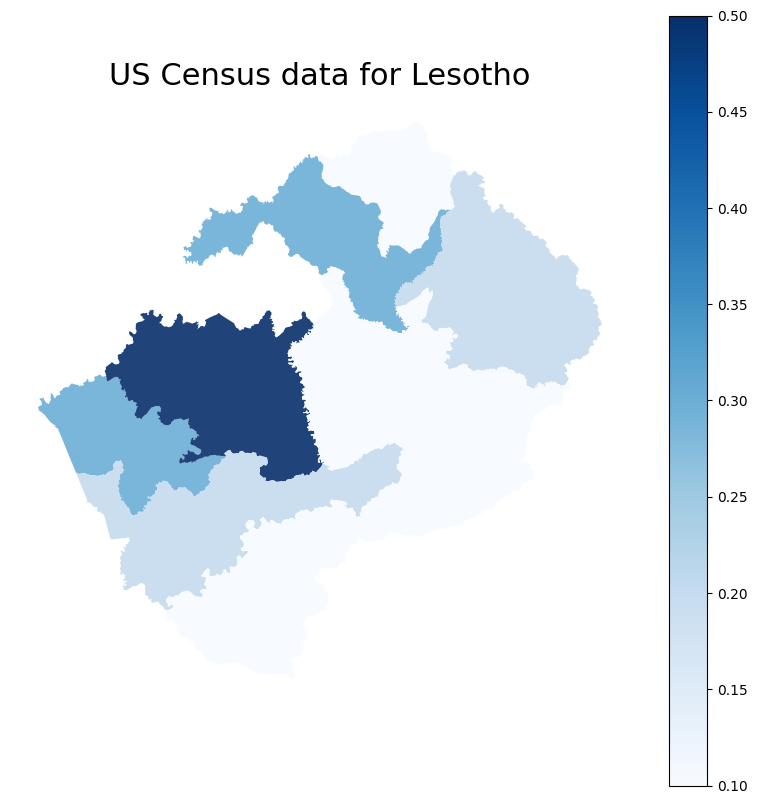

In [60]:
# import geocart as gc
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

results = pd.read_csv('worldpop+censu+facebook_million.csv')
adm_level = Lesotho_administrative_boundaries[['ADM1_NAME','geometry']].round(1).reset_index()

adm_level['population_count_census_million'] = results['population_count_census_million'].round(1)[1:]

# create a basic chloropleth map using ggplot2
p1 = gpd.plotting.plot_dataframe(adm_level, column='population_count_census_million', cmap='Blues', figsize=(10, 10), alpha=0.9, legend=True)

p1.set_title("US Census data for Lesotho", fontsize=22)
p1.set_axis_off()

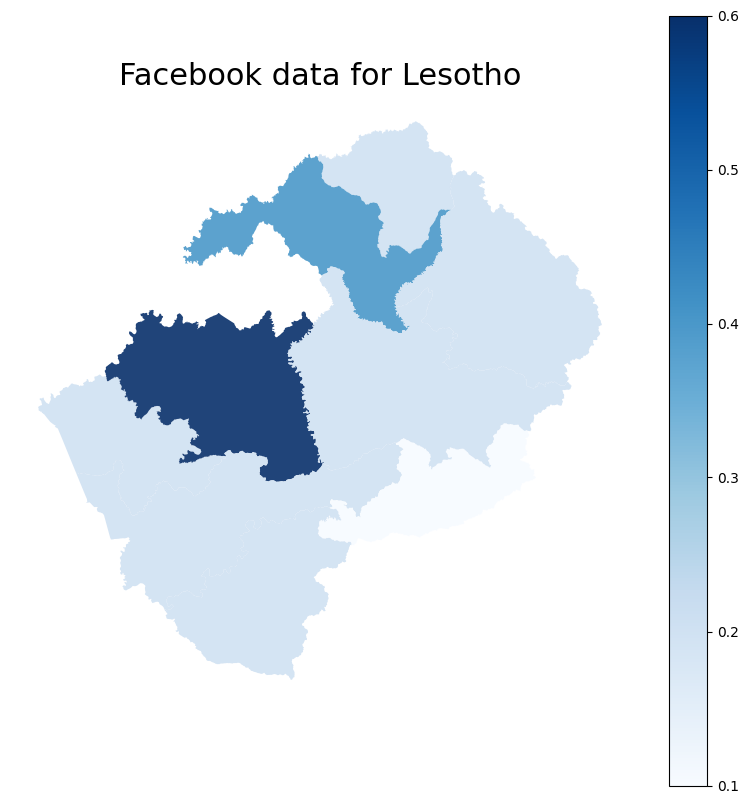

In [61]:
# import geocart as gc
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

results = pd.read_csv('worldpop+censu+facebook_million.csv')
adm_level = Lesotho_administrative_boundaries[['ADM1_NAME','geometry']].round(1).reset_index()

adm_level['population_count_fb_million'] = results['population_count_fb_million'].round(1)[1:]

# create a basic chloropleth map using ggplot2
p1 = gpd.plotting.plot_dataframe(adm_level, column='population_count_fb_million', cmap='Blues', figsize=(10, 10), alpha=0.9, legend=True)

p1.set_title("Facebook data for Lesotho", fontsize=22)
p1.set_axis_off()

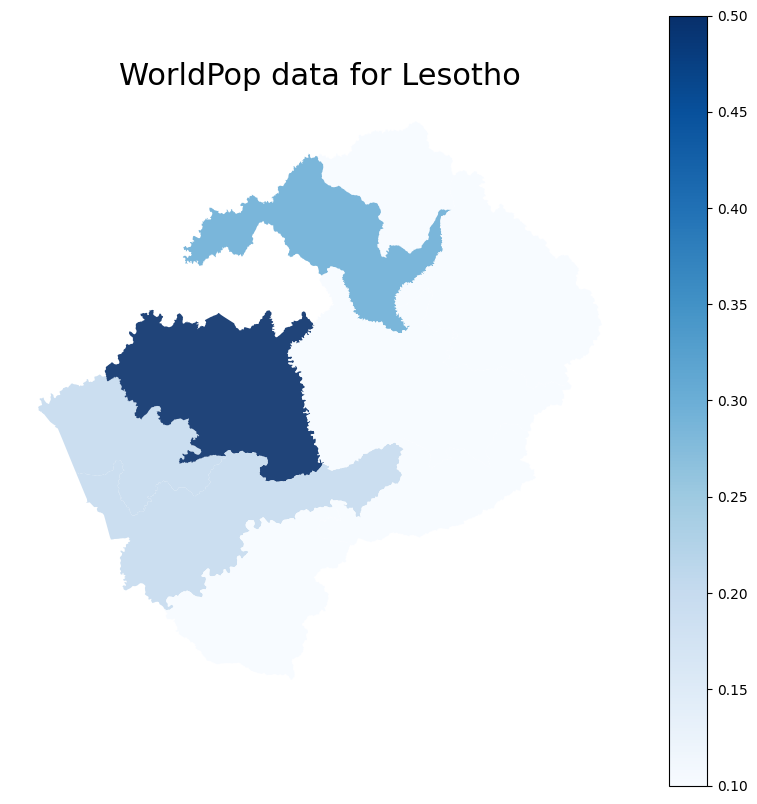

In [62]:
# import geocart as gc
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

results = pd.read_csv('worldpop+censu+facebook_million.csv')
adm_level = Lesotho_administrative_boundaries[['ADM1_NAME','geometry']].round(1).reset_index()

adm_level['population_count_wp_million'] = results['population_count_wp_million'].round(1)[1:]

# create a basic chloropleth map using ggplot2
p1 = gpd.plotting.plot_dataframe(adm_level, column='population_count_wp_million', cmap='Blues', figsize=(10, 10), alpha=0.9, legend=True)

p1.set_title("WorldPop data for Lesotho", fontsize=22)
p1.set_axis_off()

# Merge data sources together

We aim to merge the datasets: WorldPop data, Census data and Facebook data. The first step is to merge them based on district and gender, and create a new dataset with columns for the data source, region, sex, age, and population.

Next, we want to create another merged dataset for all districts by specific age, as defined by Facebook. 

The resulting merged dataset will be used for visualization in R.

### Disaggregating the three dataseys by gender (male and female)


In [63]:
def process_age_data(age):
    # Read in the raster file
    raster_file = 'Meta/lso_{}_2020_geotiff/lso_{}_2020.tif'.format(age, age)
    with rasterio.open(raster_file) as raster:
        print('No. of bands:', raster.count)

        # Reading the first band, filtering negative raster values and visualise data with matplotlib
        raster_values = raster.read(1)
        raster_values[raster_values < 0] = None

        # Compute the population count for each administrative boundary
        Lesotho_administrative_boundaries['population_count_fb'] = \
            Lesotho_administrative_boundaries['geometry'].apply(get_population_count, raster_layer=raster)
        Lesotho_administrative_boundaries['population_count_fb_million'] = \
            round(Lesotho_administrative_boundaries['population_count_fb'] / 1000000, 2)
        print(round(Lesotho_administrative_boundaries['population_count_fb'].sum() / 1000000, 2), ',milion')

        # Save the population count to a CSV file
        adm_level_c = Lesotho_administrative_boundaries[['ADM1_NAME', 'population_count_fb_million']]
        adm_level_c.to_csv('Meta/lso_fb_{}_states_pop.csv'.format(age), index=False)

        return adm_level_c

# Create a CSV file containing the administrative boundaries
Lesotho_administrative_boundaries['ADM1_NAME'].to_csv('Meta/lso_fb_2020.csv', index=False)

# Process the age-specific data and save to separate CSV files
age_list = ['general', 'women', 'men']
for age in age_list:
    process_age_data(age)

    # Add the population count to the overall CSV file
    adm_level_d = Lesotho_administrative_boundaries[['population_count_fb']]
    adm_level_d.columns = [age]
    csv_input = pd.read_csv('Meta/lso_fb_2020.csv')
    csv_input[age] = adm_level_d[age]
    csv_input.to_csv('Meta/lso_fb_2020.csv', index=False)

# Combine the age-specific CSV files into one file
results = pd.read_csv('Meta/lso_fb_2020.csv')
results.loc[10] = ['LESOTHO', results['general'].sum(), results['women'].sum(), results['men'].sum()]
results = pd.concat([results[-1:], results[:10]])
results.to_csv('lso_fb_2020.csv', index=False)  

No. of bands: 1
2.15 ,milion
No. of bands: 1
1.1 ,milion
No. of bands: 1
1.04 ,milion


In [125]:
# Import necessary libraries
import pandas as pd

# Define directory path and read the female census data
dir = 'data/'
df_f = pd.read_csv('census_les_states_female_ages_2020.csv')

# Define column names
column =['data_source','region','sex','age','population']

# Extract age groups from the female census data
age = df_f.columns[1:]

# Extract region names from the female census data
status = df_f['AREA_NAME']

# Define an empty list to store the combined data
d = []

# Loop through the data sources
for data in ['census','worldpop']:
    # Loop through the regions
    for idx, k in enumerate(status):
        # Loop through the sexes
        for j in ['female','male']:
            # Read the respective data  
            df_f = pd.read_csv(data+'_les_'+j+'_all_states_ages_2020.csv') 
            # print(df_f)
            # df_f = pd.read_csv(data+'_les_states_'+j+'_ages_2020.csv')
            # Loop through the age groups
            for i in range(17):
                # Store the data in the list
                l = [ data, k, j, age[i],df_f.iat[idx, i+1]]
                d.append(l)

# Loop through the regions
for idx, k in enumerate(status):
    # Read the Facebook data
    fb = pd.read_csv('lso_fb_2020.csv')
    # Loop through the sexes
    for j in ['women','men']:
        # Extract population data for the respective region and sex
        df_f = fb[j][idx]
        # Map women to female and men to male
        if j =='women':
            j = 'female'
        else:
            j = 'male'
        # Store the data in the list
        d.append(['facebook', k,j,'all_ages',df_f])

# Create a DataFrame from the combined data list
x = pd.DataFrame(d, columns= column)

# Write the combined data to a CSV file
x.to_csv('census_facebook_worldpop_data_together.csv',index=False)

### Disaggregating the hree datasets by specific age group (<5, 15-24, >60) 






1. Disaggregate Meta data by specific age (<5, 15-24, >60)

In [126]:
import pandas as pd
import rasterio

# Load administrative boundaries
adm_level_d = Lesotho_administrative_boundaries['ADM1_NAME']

# Create initial CSV file with administrative boundaries
adm_level_d.to_csv('Meta/facebook_les_ages_2020.csv', index=False)

# Load population raster for each age group and calculate population count
total_population = 0
for age_group in ['children_under_five', 'youth_15_24', 'elderly_60_plus']:
    # Load population raster
    raster_path = f'Meta/lso_{age_group}_2020_geotiff/lso_{age_group}_2020.tif'
    with rasterio.open(raster_path) as raster:
        raster_values = raster.read(1)

        # Calculate population count
        Lesotho_administrative_boundaries[f'population_count_{age_group}']  = Lesotho_administrative_boundaries['geometry'].apply(get_population_count, raster_layer=raster)
        Lesotho_administrative_boundaries[f'population_count_{age_group}_million'] = round(Lesotho_administrative_boundaries[f'population_count_{age_group}'] / 1000000, 2)

    # Add age group population counts to CSV file
    adm_level_c = Lesotho_administrative_boundaries[['ADM1_NAME', f'population_count_{age_group}']]
    adm_level_c.columns = ['ADM1_NAME', age_group]
    df = pd.read_csv('Meta/facebook_les_ages_2020.csv')
    df = pd.merge(df, adm_level_c, on='ADM1_NAME', how='left')
    df.to_csv('Meta/facebook_les_ages_2020.csv', index=False)

    # Calculate total population
    meta_raster_nonzero = raster_values[raster_values > 0]
    population_meta = meta_raster_nonzero.sum()
    total_population += population_meta
    print(f'{age_group}: {round(population_meta/1000000, 2)} million')

# Add total population to CSV file
df = pd.read_csv('Meta/facebook_les_ages_2020.csv')
total_row = ['LESOTHO',df['children_under_five'].sum(),df['youth_15_24'].sum(),df['elderly_60_plus'].sum()]
# total_row = pd.DataFrame([['LESOTHO', total_population[0], total_population[1], total_population[2]]], columns=['ADM1_NAME', 'children_under_five', 'youth_15_24', 'elderly_60_plus'])
df = pd.concat([df[-1:],df[:10]])
df.to_csv('Meta/facebook_les_ages_2020.csv', index=False)
df.to_csv('facebook_les_ages_2020.csv', index=False)

children_under_five: 0.76 million
youth_15_24: 1.39 million
elderly_60_plus: 0.53 million


2. Disaggregate US Census data by specific age (<5, 15-24, >60)

In [127]:
# Read the Census data file
census = pd.read_csv('census_les_states_ages_2020.csv')
# print(census)
# Calculate the age groups
census['ADM1_NAME'] = census['AREA_NAME']
census['children_under_five'] = census.iloc[:,1:3].sum(axis=1)
census['youth_15_24'] = census.iloc[:,4:7].sum(axis=1)
census['elderly_60_plus'] = census.iloc[:,13:].sum(axis=1)

# Select only the ADM1_NAME and age group columns
age_groups = [col for col in census.columns if col in ['ADM1_NAME', 'children_under_five', 'youth_15_24', 'elderly_60_plus']]
census = census[age_groups]

# Save the result to a CSV file
census.to_csv('census_les_ages_2020.csv', index=False)


3. Disaggregate WorldPop data by specific age (<5, 15-24, >60)

In [128]:
import pandas as pd

# Read data
worldpop_f = pd.read_csv('worldpop_les_female_all_states_ages_2020.csv')
worldpop_m = pd.read_csv('worldpop_les_male_all_states_ages_2020.csv')


# Calculate age groups
age_groups = {
    'children_under_five': [1, 2],
    'youth_15_24': [4, 5, 6],
    'elderly_60_plus': list(range(13, worldpop_f.shape[1]))
}

for group, cols in age_groups.items():
    worldpop_f[group] = worldpop_f.iloc[:, cols].sum(axis=1)
    worldpop_m[group] = worldpop_m.iloc[:, cols].sum(axis=1)

# Select age group columns
worldpop_f = worldpop_f[age_groups.keys()]
worldpop_m = worldpop_m[age_groups.keys()]


df = pd.read_csv('worldpop_les_female_all_states_ages_2020.csv')
worldpop_f['ADM1_NAME'] =df['ADM1_NAME']
worldpop_m['ADM1_NAME'] =df['ADM1_NAME']

# Sum male and female data
df_add = worldpop_f.add(worldpop_m, fill_value=0)

# Add administrative name column and save
df_add = pd.concat([worldpop_f['ADM1_NAME'], df_add], axis=1)
df_add.to_csv('worldpop_les_ages_2020.csv', index=False)

Combine both data together in one file

In [129]:
import pandas as pd


# Merge both data sources together
fb = pd.read_csv('lso_fb_2020.csv')

# Combine all the data sources in one file
column = ['data_source', 'region', 'age', 'population']
age = ['children_under_five', 'youth_15_24', 'elderly_60_plus']
status = fb['ADM1_NAME']

d = []
for data in ['census','worldpop', 'facebook']:
    for idx, k in enumerate(status):
        df = pd.read_csv(data+'_les_ages_2020.csv')

        for i in range(3):
            l = [data, k, age[i], df.iat[idx, i+1]]
            d.append(l)

x = pd.DataFrame(d, columns=column)
x.to_csv('census+facebook+worldpop_by_specific_ages.csv', index=False)
x

,data_source,region,age,population
0,census,LESOTHO,children_under_five,417171.00
1,census,LESOTHO,youth_15_24,558870.00
2,census,LESOTHO,elderly_60_plus,1132277.00
3,census,BEREA,children_under_five,25200.00
4,census,BEREA,youth_15_24,31706.00
...,...,...,...,...
94,facebook,QUTHING,youth_15_24,36267.21
95,facebook,QUTHING,elderly_60_plus,13818.37
96,facebook,THABA-TSEKA,children_under_five,21730.92
97,facebook,THABA-TSEKA,youth_15_24,35744.90


# Compare the three datasets

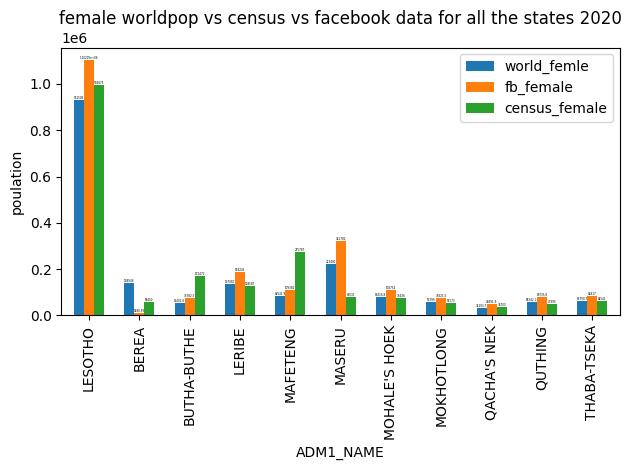

In [134]:
wf_mf= pd.read_csv('census+facebook+world_female.csv')
wf_mf
ax = wf_mf.plot.bar(x='ADM1_NAME', title='female worldpop vs census vs facebook data for all the states 2020' , width=.6)
ax.set_ylabel('poulation')

for container in ax.containers:
    ax.bar_label(container, fontsize=2)
# plt.figure(figsize=(14,40))

plt.tight_layout()
plt.savefig('female_data')
plt.show()

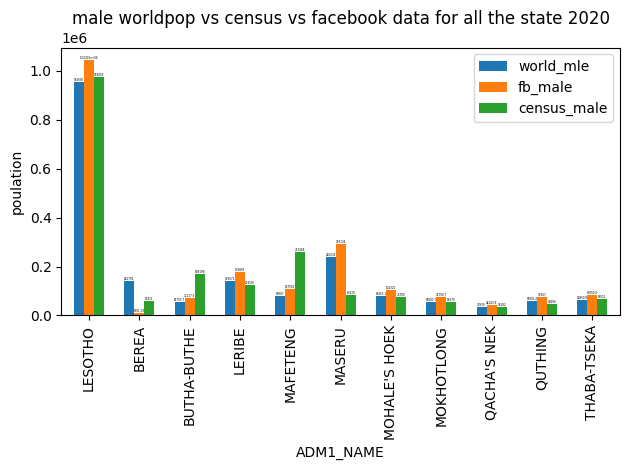

In [135]:
wf_m= pd.read_csv('census+facebook+world_male.csv')
wf_m

ax = wf_m.plot.bar(x='ADM1_NAME', title='male worldpop vs census vs facebook data for all the state 2020' , width=.6)
ax.set_ylabel('poulation')

for container in ax.containers:
    ax.bar_label(container, fontsize=2)
# plt.figure(figsize=(14,40))

plt.tight_layout()
plt.savefig('male_data')
plt.show()

# Using R

![](https://raw.githubusercontent.com/MLGlobalHealth/population-comparison/main/fig/all_data_by_specific_ages.png)

![](https://raw.githubusercontent.com/MLGlobalHealth/population-comparison/main/fig/woldpop%2Bcensus%2Bage_and_sex_only_lesotho.png)

![](https://raw.githubusercontent.com/MLGlobalHealth/population-comparison/main/fig/worldpop%2Bcensus%2Bfacebook_sex.png)

![](https://raw.githubusercontent.com/MLGlobalHealth/population-comparison/main/fig/cartogram_all_data_1.png)

![](https://raw.githubusercontent.com/MLGlobalHealth/population-comparison/main/fig/Worldpop_female_cartogram.png)

![](https://raw.githubusercontent.com/MLGlobalHealth/population-comparison/main/fig/Worldpop_male_cartogram.png)
